In [179]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LinearRegression

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import IsolationForest
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeRegressor

In [2]:
url = r"C:\Users\gonza\Downloads\melb_data.csv\melb_data.csv"
data = pd.read_csv(url,parse_dates=["Date"])
data.head(3)

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,2016-03-12,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,2016-04-02,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,2017-04-03,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0


In [3]:
# vemos nullos
def show_nam_df(x):
    nulos = x.isnull().sum()
    col_nul = nulos[nulos > 0]
    col_por = round((col_nul / len(x)) * 100,2)
    df_nul = pd.DataFrame(data={"Total":col_nul,"Porcentaje":col_por})
    return df_nul

In [4]:
show_nam_df(data)

,Total,Porcentaje
Car,62,0.46
BuildingArea,6450,47.50
YearBuilt,5375,39.58
CouncilArea,1369,10.08


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13580 entries, 0 to 13579
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Suburb         13580 non-null  object        
 1   Address        13580 non-null  object        
 2   Rooms          13580 non-null  int64         
 3   Type           13580 non-null  object        
 4   Price          13580 non-null  float64       
 5   Method         13580 non-null  object        
 6   SellerG        13580 non-null  object        
 7   Date           13580 non-null  datetime64[ns]
 8   Distance       13580 non-null  float64       
 9   Postcode       13580 non-null  float64       
 10  Bedroom2       13580 non-null  float64       
 11  Bathroom       13580 non-null  float64       
 12  Car            13518 non-null  float64       
 13  Landsize       13580 non-null  float64       
 14  BuildingArea   7130 non-null   float64       
 15  YearBuilt      8205

In [6]:
# descripcion variables numericas
data.describe()

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,13580.000000,1.358000e+04,13580.000000,13580.000000,13580.000000,13580.000000,13518.000000,13580.000000,7130.000000,8205.000000,13580.000000,13580.000000,13580.000000
mean,2.937997,1.075684e+06,10.137776,3105.301915,2.914728,1.534242,1.610075,558.416127,151.967650,1964.684217,-37.809203,144.995216,7454.417378
std,0.955748,6.393107e+05,5.868725,90.676964,0.965921,0.691712,0.962634,3990.669241,541.014538,37.273762,0.079260,0.103916,4378.581772
min,1.000000,8.500000e+04,0.000000,3000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1196.000000,-38.182550,144.431810,249.000000
25%,2.000000,6.500000e+05,6.100000,3044.000000,2.000000,1.000000,1.000000,177.000000,93.000000,1940.000000,-37.856822,144.929600,4380.000000
50%,3.000000,9.030000e+05,9.200000,3084.000000,3.000000,1.000000,2.000000,440.000000,126.000000,1970.000000,-37.802355,145.000100,6555.000000
75%,3.000000,1.330000e+06,13.000000,3148.000000,3.000000,2.000000,2.000000,651.000000,174.000000,1999.000000,-37.756400,145.058305,10331.000000
max,10.000000,9.000000e+06,48.100000,3977.000000,20.000000,8.000000,10.000000,433014.000000,44515.000000,2018.000000,-37.408530,145.526350,21650.000000


In [7]:
# descripcion variables categoricas
data.describe(include="object")

,Suburb,Address,Type,Method,SellerG,CouncilArea,Regionname
count,13580,13580,13580,13580,13580,12211,13580
unique,314,13378,3,5,268,33,8
top,Reservoir,13 Robinson St,h,S,Nelson,Moreland,Southern Metropolitan
freq,359,3,9449,9022,1565,1163,4695


In [8]:
# Vamos a trabajar con una copia, sin las columnas con mas nan ( son demasiados)
cols_remove = ["BuildingArea","YearBuilt"]
data_remove = data.copy().drop(cols_remove,axis=1)


In [112]:
# funcion para describe mas porcentaje sobre el total
def describe_porcentage(groupby="CouncilArea",sort="Price"):
    type_remove = ["Postcode","Lattitude","Longtitude"]
    type_porcentaje = round(data_remove.groupby(groupby).size() / len(data) * 100,2)
    type_df = data_remove.drop(type_remove,axis=1).groupby(groupby).mean()
    type_df["Percentage"] = type_porcentaje.values
    return type_df.sort_values(by=sort,ascending=False)

In [114]:
describe_porcentage(groupby="CouncilArea",sort="Price").head(10)

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,Propertycount,Percentage
CouncilArea,,,,,,,,,
Bayside,3.186094,1.652168e+06,12.306339,3.161554,1.871166,1.854806,483.316973,7496.877301,3.60
Boroondara,3.121552,1.647217e+06,7.761810,3.073276,1.775862,1.756897,605.540517,8043.870690,8.54
Unavailable,3.000000,1.325000e+06,13.800000,3.000000,1.000000,2.000000,400.000000,5454.000000,0.01
Stonnington,2.431154,1.293382e+06,5.996245,2.424200,1.479833,1.325452,485.496523,8807.752434,5.29
Manningham,3.591640,1.235161e+06,13.511254,3.588424,1.906752,1.958199,658.128617,6936.218650,2.29
Whitehorse,3.279605,1.234218e+06,13.074013,3.250000,1.631579,1.723684,534.315789,4821.582237,2.24
Monash,3.282282,1.168289e+06,14.082883,3.243243,1.633634,1.864865,542.531532,6038.672673,2.45
Port Phillip,2.286624,1.144346e+06,5.024363,2.278662,1.377389,1.019108,423.068471,8208.928344,4.62
Yarra,2.367852,1.127605e+06,2.721793,2.363215,1.374034,0.914992,1129.047913,8408.701700,4.76


In [161]:
describe_porcentage(groupby="Type",sort="Percentage")

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,Propertycount,Percentage
Type,,,,,,,,,
h,3.260874,1.242665e+06,10.979479,3.229336,1.613822,1.771222,617.181924,7259.025505,69.58
u,1.963871,6.051275e+05,7.607391,1.966523,1.183295,1.128358,477.314219,8199.280080,22.22
t,2.837522,9.337351e+05,9.851346,2.814183,1.809695,1.555655,279.606822,7094.459605,8.20


In [146]:
describe_porcentage(groupby="Regionname",sort="Price").style.background_gradient(cmap='Blues')

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,Propertycount,Percentage
Regionname,,,,,,,,,
Southern Metropolitan,2.860916,1372963.369329,8.756656,2.835144,1.624068,1.576264,509.252183,7622.279233,34.570000
Eastern Metropolitan,3.322230,1104079.634262,13.901088,3.313392,1.698844,1.792916,634.133923,5713.788579,10.830000
South-Eastern Metropolitan,3.360000,922943.784444,23.813556,3.355556,1.657778,2.044444,613.991111,6589.366667,3.310000
Northern Metropolitan,2.755527,898171.082262,8.078329,2.734190,1.367866,1.454123,568.948072,9485.602057,28.650000
Western Metropolitan,3.023406,866420.520014,10.104579,2.990502,1.501018,1.696392,493.606852,5561.785957,21.710000
Eastern Victoria,3.396226,699980.792453,34.209434,3.396226,1.811321,2.056604,2949.698113,8872.358491,0.390000
Northern Victoria,3.560976,594829.268293,33.748780,3.560976,1.853659,1.925000,3355.463415,4260.975610,0.300000
Western Victoria,3.406250,397523.437500,30.753125,3.406250,1.468750,1.843750,655.500000,4191.156250,0.240000


In [147]:
describe_porcentage(groupby="Method",sort="Price")

,Rooms,Price,Distance,Bedroom2,Bathroom,Car,Landsize,Propertycount,Percentage
Method,,,,,,,,,
VB,2.924103,1.166510e+06,8.273728,2.896580,1.675563,1.602359,927.331943,7307.331943,8.83
PI,3.077366,1.133242e+06,9.482097,3.062660,1.714194,1.703918,521.682864,7749.644501,11.52
S,2.941809,1.087327e+06,10.431523,2.914875,1.498781,1.602581,531.129905,7496.049435,66.44
SA,3.010870,1.025772e+06,12.385870,3.010870,1.554348,1.769231,699.532609,6945.902174,0.68
SP,2.795655,8.998924e+05,10.374692,2.785672,1.456254,1.560472,469.346447,7093.759248,12.54


### modelo

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002B68ECC70D0>,
      dtype=object)

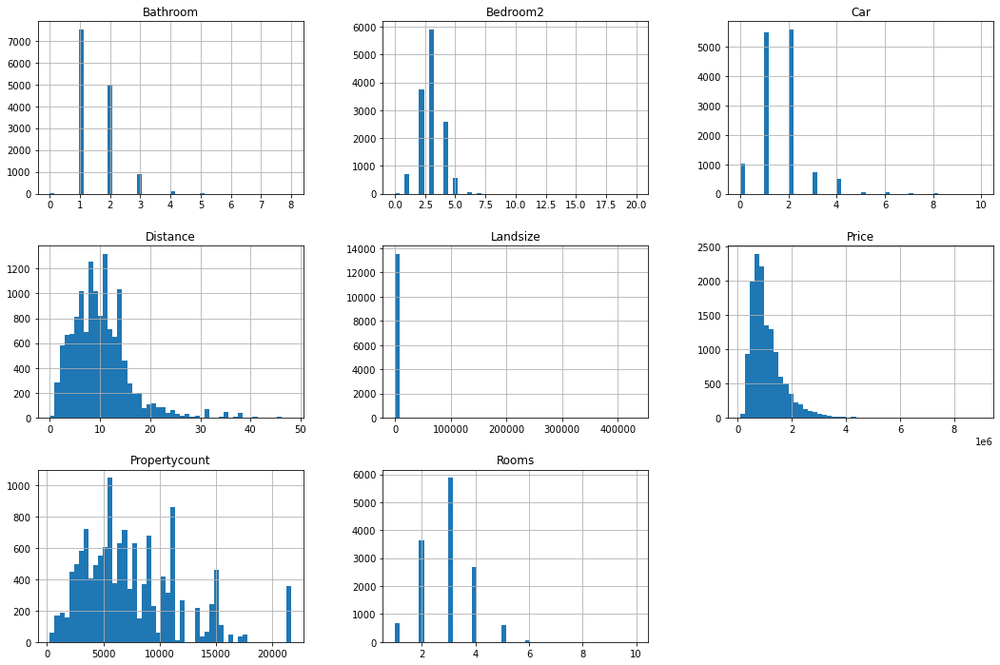

In [164]:
hist_cols = ['Rooms','Price','Distance','Bedroom2', 'Bathroom', 'Car','Landsize','Propertycount']
data_remove[hist_cols].hist(bins=50,figsize=(18,12))

In [17]:
# corr
corr = data_remove.corr()
pd.DataFrame(corr["Price"].sort_values(ascending=False)).style.background_gradient(cmap='viridis')

,Price
Price,1.000000
Rooms,0.496634
Bedroom2,0.475951
Bathroom,0.467038
Car,0.238979
Longtitude,0.203656
Postcode,0.107867
Landsize,0.037507
Propertycount,-0.042153
Distance,-0.162522


The correlation coefficient ranges from –1 to 1. When it is close to 1, it means that
there is a strong positive correlation; for example, the median house value tends to go
up when the median income goes up. When the coefficient is close to –1, it means
that there is a strong negative correlation; you can see a small negative correlation
between the latitude and the median house value (i.e., prices have a slight tendency to
go down when you go north). Finally, coefficients close to zero mean that there is no
linear correlation

In [18]:
corr.style.background_gradient(cmap='Blues')

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,Lattitude,Longtitude,Propertycount
Rooms,1.000000,0.496634,0.294203,0.055303,0.944190,0.592934,0.408483,0.025678,0.015948,0.100771,-0.081530
Price,0.496634,1.000000,-0.162522,0.107867,0.475951,0.467038,0.238979,0.037507,-0.212934,0.203656,-0.042153
Distance,0.294203,-0.162522,1.000000,0.431514,0.295927,0.127155,0.262994,0.025004,-0.130723,0.239425,-0.054910
Postcode,0.055303,0.107867,0.431514,1.000000,0.060584,0.113664,0.050289,0.024558,-0.406104,0.445357,0.062304
Bedroom2,0.944190,0.475951,0.295927,0.060584,1.000000,0.584685,0.405325,0.025646,0.015925,0.102238,-0.081350
Bathroom,0.592934,0.467038,0.127155,0.113664,0.584685,1.000000,0.322246,0.037130,-0.070594,0.118971,-0.052201
Car,0.408483,0.238979,0.262994,0.050289,0.405325,0.322246,1.000000,0.026770,-0.001963,0.063395,-0.024295
Landsize,0.025678,0.037507,0.025004,0.024558,0.025646,0.037130,0.026770,1.000000,0.009695,0.010833,-0.006854
Lattitude,0.015948,-0.212934,-0.130723,-0.406104,0.015925,-0.070594,-0.001963,0.009695,1.000000,-0.357634,0.047086
Longtitude,0.100771,0.203656,0.239425,0.445357,0.102238,0.118971,0.063395,0.010833,-0.357634,1.000000,0.065988


rooms and bedrooms correlacioneadas, hay que quitarlas

In [165]:
# Now, we have to define the Bounding Box. Bounding Box is the area defined by two longitudes and two latitudes that will include all spatial points.
BBox = (data_remove.Longtitude.min(),data_remove.Longtitude.max(),
        data_remove.Lattitude.min(),data_remove.Lattitude.max())

BBox

(144.43181, 145.52635, -38.18255, -37.40853)

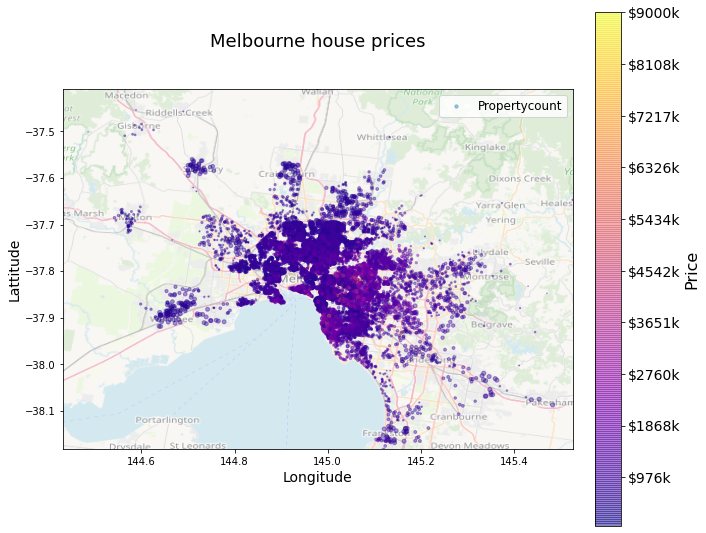

In [166]:
map = plt.imread(r"C:\Users\gonza\Repositorios\TestGit\map.png")

fig, ax = plt.subplots(figsize = (10,10))
ax.scatter(x="Longtitude",y="Lattitude",c="Price", alpha=0.4,cmap=plt.get_cmap("plasma"),s=data_remove["Propertycount"]/1000,label="Propertycount",data=data_remove,zorder=1)

ax.set_title('Melbourne house prices',fontsize=18,y=1.1)
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
plt.xlabel("Longitude",fontsize=14)
plt.ylabel("Lattitude",fontsize=14)

img = ax.imshow(map, zorder=0, extent = BBox, aspect= 'equal',cmap=plt.get_cmap("plasma"),alpha=0.5)

prices = data_remove["Price"]
tick_values = np.linspace(prices.min(), prices.max(), 11)
cb = plt.colorbar(img,ticks=tick_values/prices.max(),fraction=0.046, pad=0.04)
cb.ax.set_yticklabels(["$%dk"%(round(v/1000)) for v in tick_values], fontsize=14)
cb.set_label("Price",fontsize=16)
plt.legend(fontsize=12)

### modelo ahora si

In [168]:
# delete these columns
cols_remove_model = ["Bedroom2","Suburb","Address",'Method','SellerG',"Date"]

In [169]:
data_model = data_remove.copy().drop(cols_remove_model,axis=1)


In [170]:
data_model.head(3)

,Rooms,Type,Price,Distance,Postcode,Bathroom,Car,Landsize,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,2,h,1480000.0,2.5,3067.0,1.0,1.0,202.0,Yarra,-37.7996,144.9984,Northern Metropolitan,4019.0
1,2,h,1035000.0,2.5,3067.0,1.0,0.0,156.0,Yarra,-37.8079,144.9934,Northern Metropolitan,4019.0
2,3,h,1465000.0,2.5,3067.0,2.0,0.0,134.0,Yarra,-37.8093,144.9944,Northern Metropolitan,4019.0


In [171]:
X = data_model.drop("Price",axis=1)
y = data_model["Price"]

###  Preprocessing Steps
Similar to how a pipeline bundles together preprocessing and modeling steps, we use the ColumnTransformer class to bundle together different preprocessing steps. 

In [172]:
# separate categorical and numerical
categorical_cols=[x for x in data_model.columns.values if data_model[x].dtype == "object"]
numerical_cols = [x for x in X.columns.values if x not in categorical_cols]

In [173]:
# prepocesing numerical data
numerical_transformer = Pipeline(steps=[
    ("imputer",SimpleImputer(strategy="median")),
    ("scaler",StandardScaler())
])
# prepocesing categorical data
categorical_transformer = Pipeline(steps=[
    ("imputer", SimpleImputer(strategy="most_frequent")),
    ("onehot",OneHotEncoder(handle_unknown="ignore"))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

### Define the Model

In [174]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [ ]:
# vamos a crear un dict con todos los resultados

In [175]:
def pipeline_train(X_train,X_test):
     # Bundle preprocessing and modeling code in a pipeline
    my_pipeline = Pipeline(steps=[('preprocessor', preprocessor)])                               
                               

    # Preprocessing of training data, fit model 
    X_train_fit = my_pipeline.fit_transform(X_train)
    X_test_fit = my_pipeline.transform(X_test)
    return X_train_fit,X_test_fit

def baseline_regresion(X_train_fit,y_train):
    models ={"lr": LinearRegression(),"rdf":RandomForestRegressor(),"Dt":DecisionTreeRegressor(),
            "Gn":GradientBoostingRegressor()}           
    kfold = StratifiedKFold(n_splits=10, random_state=100)
    for key,model_kfold in models.items():        
        results_kfold = cross_val_score(model_kfold, X_train_fit, y_train, cv=kfold)
        print(f"Accuracy {key}: {results_kfold.mean()*100.0}")



In [180]:
X_train_fit,X_test_fit  = pipeline_train(X_train,X_test)
baseline_regresion(X_train_fit,y_train)

Accuracy lr: 61.40191251307695
Accuracy rdf: 79.24069663045319
Accuracy Dt: 58.413532476854066
Accuracy Gn: 76.99225405668845


In [181]:
## vamos buscar parametros para random forest
model_rdf = RandomForestRegressor(random_state=0)
rdf_grid = { "max_depth": [10, 20, 30, 40],
                    'max_features': ['auto', 'sqrt'],
                    'min_samples_leaf': [1, 2, 4],
                    'min_samples_split': [2, 5, 10],
                    'n_estimators': [50,100,200, 400]}
randomize_rdf = RandomizedSearchCV(model_rdf,rdf_grid,random_state=0,n_iter=100,cv=3,n_jobs=-1)
search_rdf = randomizecv.fit(X_train_fit,y_train)
search_rdf.best_params_

{'n_estimators': 100,
 'min_samples_split': 10,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 10}

In [ ]:
search_rdf.best_score_

In [39]:
### tenemos que remover outliers despues del prepocesado(solo numerico ¡¡¡) o antes si usamos manual

In [40]:
# outliers
from sklearn.ensemble import IsolationForest

def outliers(X_train,y_train):
    #outliers
    iso = IsolationForest(contamination=0.1)
    yhat = iso.fit_predict(X_train)

    # select all rows that are not outliers
    mask = yhat != -1
    X_train, y_train = X_train[mask, :], y_train[mask]
    return X_train, y_train



### separar por modulos mejor para que no sea tan lento

### modulos
vemos que podemos transformar pipeline (ojo con test solo transform ¡¡ ver titanic)

In [46]:
def pipeline_train(X_train):
     # Bundle preprocessing and modeling code in a pipeline
    my_pipeline = Pipeline(steps=[('preprocessor', preprocessor)])                               
                               

    # Preprocessing of training data, fit model 
    X_train_fit = my_pipeline.fit_transform(X_train)
    return X_train_fit

cuando son muchos hiperparametros podemos usar randomize mejor que gridd (hace busqueda random)

In [48]:
from sklearn.model_selection import RandomizedSearchCV
X_train_fit = pipeline_train(X_train)
model_gbr = GradientBoostingRegressor(random_state=0)
random_grid = { "max_depth": [10, 20, 30, 40],
                    'max_features': ['auto', 'sqrt'],
                    'min_samples_leaf': [1, 2, 4],
                    'min_samples_split': [2, 5, 10],
                    'n_estimators': [50,100,200, 400]}
randomizecv = RandomizedSearchCV(model_gbr,random_grid,random_state=0)
search = randomizecv.fit(X_train_fit,y_train)
search.best_params_

{'n_estimators': 100,
 'min_samples_split': 10,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 10}

ahora salvamos el modelo (ojo con best estimators ¡¡)

In [53]:
search.best_score_

0.8048313279192504

In [62]:
search.best_estimator_

GradientBoostingRegressor(max_depth=10, max_features='sqrt',
                          min_samples_split=10, random_state=0)

In [63]:
# save model
import joblib
joblib.dump(search.best_estimator_,"melbourne_model.pkl",compress=1)

['melbourne_model.pkl']

In [64]:
def pipeline_test(X_test,y_test):
     # Bundle preprocessing and modeling code in a pipeline
    my_pipeline = Pipeline(steps=[('preprocessor', preprocessor)])                            
                               

    # Preprocessing of test data and transform (no fit¡¡)
    X_test_fit = my_pipeline.transform(X_test)
    # load model
    load_model = joblib.load('melbourne_model.pkl')
    result = load_model.score(X_test_fit,y_test)
    print(result)
   


In [65]:
pipeline_test(X_test,y_test)

0.7799207574675117


In [134]:
### quitamos outliers a ver que pasa
data_outliers = data_remove.copy()
# cols
cols_remove_model = ["Suburb","Address",'Method','SellerG',"Date","Bedroom2"]

In [135]:
X_o = data_outliers.drop("Price",axis=1)
y_o = data_outliers["Price"]

In [136]:
X_train_o, X_test_o, y_train_o, y_test_o = train_test_split(X, y, test_size=0.3, random_state=0)

In [ ]:
def pipeline_train(X_train):
     # Bundle preprocessing and modeling code in a pipeline
    my_pipeline = Pipeline(steps=[('preprocessor', preprocessor)])                               
                               

    # Preprocessing of training data, fit model 
    X_train_fit = my_pipeline.fit_transform(X_train)
    return X_train_fit

def outliers(X_train,y_train):
    #outliers
    iso = IsolationForest(contamination=0.1)
    yhat = iso.fit_predict(X_train)

    # select all rows that are not outliers
    mask = yhat != -1
    X_train, y_train = X_train[mask, :], y_train[mask]
    return X_train, y_train


def pipeline_test(X_test,y_test):
     # Bundle preprocessing and modeling code in a pipeline
    my_pipeline = Pipeline(steps=[('preprocessor', preprocessor)])                            
                               

    # Preprocessing of test data and transform (no fit¡¡)
    X_test_fit = my_pipeline.transform(X_test)
    # load model
    load_model = joblib.load('melbourne_model.pkl')
    result = load_model.score(X_test_fit,y_test)
    print(result)
   


In [137]:
# pipeline
X_train_o = pipeline_train(X_train_o)

In [138]:
# remove outliers
X_train_outliers, y_train_outliers = outliers(X_train_o,y_train_o)

In [ ]:

model_gbr = GradientBoostingRegressor(random_state=0)
random_grid = { "max_depth": [10, 20, 30, 40],
                    'max_features': ['auto', 'sqrt'],
                    'min_samples_leaf': [1, 2, 4],
                    'min_samples_split': [2, 5, 10],
                    'n_estimators': [50,100,200, 400]}
randomizecv = RandomizedSearchCV(model_gbr,random_grid,random_state=0)
search = randomizecv.fit(X_train_fit,y_train)
search.best_params_

In [143]:
search_outliers = randomizecv.fit(X_train_outliers, y_train_outliers)
search_outliers.best_params_


{'n_estimators': 100,
 'min_samples_split': 10,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 10}

In [144]:
search_outliers.best_score_

0.8026194496859661

In [150]:
    my_pipeline = Pipeline(steps=[('preprocessor', preprocessor)])                            
                               

    # Preprocessing of test data and transform (no fit¡¡)
    X_test_outliers = my_pipeline.transform(X_test_o)
    # load model
    search_outliers.best_estimator_.score(X_test_outliers,y_test_o)

0.7886170003827787